This notebook provides examples to go along with the [textbook](http://underactuated.csail.mit.edu/lyapunov.html).  I recommend having both windows open, side-by-side!

[Click here](http://underactuated.csail.mit.edu/drake.html#notebooks) for instructions on how to run the notebook on Deepnote and/or Google Colab.

In [5]:
import matplotlib.pyplot as plt
import mpld3
import numpy as np
from IPython.display import Markdown, display
from pydrake.all import (Jacobian, MathematicalProgram, Polynomial,
                         RegionOfAttraction, RegionOfAttractionOptions, Solve,
                         SymbolicVectorSystem, ToLatex, Variable, Variables,
                         plot_sublevelset_expression)
from pydrake.examples.pendulum import PendulumParams
from pydrake.examples.van_der_pol import VanDerPolOscillator
from pydrake.symbolic import Polynomial

from underactuated import plot_2d_phase_portrait, running_as_notebook

if running_as_notebook:
    mpld3.enable_notebook()

import math

# Common Lyapunov Analysis for Linear Systems

In [2]:
def common_lyapunov():
    A = []
    if (True):
        # Generate random stable matrices.
        num_states = 4
        num_systems = 2
        for i in range(num_systems):
            d = -np.random.rand(num_states,)
            v = np.random.randn(num_states, num_states)
            A.append(v.dot(np.diag(d).dot(np.linalg.inv(v))))
    else:
        # Example from lecture notes.
        A.append = np.array(((-1, .5), (-3, -1)))
        A.append = np.array(((-1, .1), (-10, -1)))
        # Interesting for 2D plotting (a two element parameterization of stable
        # linear systems).  Stable iff ab < 1.
        # a = randn;  ab = 2*rand - 1;  b=ab/a;
        # A{i} = [-1 a; b -1];

    # Create the optimization problem.
    prog = MathematicalProgram()

    # Construct an n-by-n positive semi-definite matrix as the decision
    # variables.
    num_states = A[0].shape[0]
    P = prog.NewSymmetricContinuousVariables(num_states, "P")
    prog.AddPositiveSemidefiniteConstraint(P - .01 * np.identity(num_states))

    # Add the common Lyapunov conditions.
    for i in range(len(A)):
        # yapf: disable
        prog.AddPositiveSemidefiniteConstraint(
            -A[i].transpose().dot(P) - P.dot(A[i]) - .01 * np.identity(num_states))
        # yapf: enable

    # Add an objective.
    prog.AddLinearCost(np.trace(P))

    # Run the optimization.
    result = Solve(prog)

    if result.is_success():
        P = result.GetSolution(P)
        print("eig(P) =" + str(np.linalg.eig(P)[0]))
        for i in range(len(A)):
            print("eig(Pdot" + str(i) + ") = " +
                str(np.linalg.eig(A[i].transpose().dot(P) + P.dot(A[i]))[0]))
    else:
        print("Could not find a common Lyapunov function.")
        print("This is expected to occur with some probability:  not all")
        print("random sets of stable matrices will have a common Lyapunov")
        print("function.")

common_lyapunov()

eig(P) =[0.03305431 0.05378727 0.14559679 0.24311682]
eig(Pdot0) = [-0.46845851 -0.04058526 -0.01       -0.01      ]
eig(Pdot1) = [-0.1340257  -0.04207288 -0.01       -0.01      ]


# Verifying a Lyapunov candidate via SOS

Successfully verified Lyapunov candidate


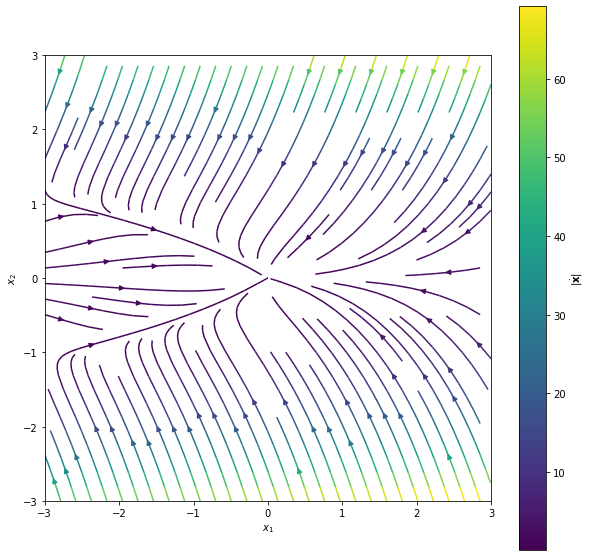

In [3]:
def sos_verify():
    prog = MathematicalProgram()
    x = prog.NewIndeterminates(2, "x")
    f = [-x[0] - 2 * x[1]**2, -x[1] - x[0] * x[1] - 2 * x[1]**3]

    V = x[0]**2 + 2 * x[1]**2
    Vdot = V.Jacobian(x).dot(f)

    prog.AddSosConstraint(-Vdot)

    result = Solve(prog)
    assert result.is_success()

    sys = SymbolicVectorSystem(state=x, dynamics=f)
    fig, ax = plt.subplots(figsize=(10,10))
    plot_2d_phase_portrait(sys, (-3, 3), (-3, 3))
    print("Successfully verified Lyapunov candidate")

sos_verify()

# Searching for a Lyapunov function via SOS

In [4]:
def sos_optimize():
    prog = MathematicalProgram()
    x = prog.NewIndeterminates(2, "x")
    f = [-x[0] - 2 * x[1]**2, -x[1] - x[0] * x[1] - 2 * x[1]**3]

    V = prog.NewSosPolynomial(Variables(x), 2)[0].ToExpression()
    print("Candidate:")
    display(Markdown("$V(x) = " + ToLatex(V) + "$"))
    prog.AddLinearConstraint(V.Substitute({x[0]: 0, x[1]: 0}) == 0)
    prog.AddLinearConstraint(V.Substitute({x[0]: 1, x[1]: 0}) == 1)
    Vdot = V.Jacobian(x).dot(f)

    prog.AddSosConstraint(-Vdot)

    result = Solve(prog)
    assert result.is_success()

    print("Solution:")
    display(Markdown("$V(x) = " + ToLatex(
        Polynomial(result.GetSolution(V)).RemoveTermsWithSmallCoefficients(1e-5).ToExpression(),6) + "$"))


sos_optimize()

Candidate:


$V(x) = (S_{2,2} + 2x_{0} x_{1} S_{1,0} + 2x_{0} S_{2,1} + x_{0}^{2} S_{1,1} + 2x_{1} S_{2,0} + x_{1}^{2} S_{0,0})$

Solution:


$V(x) = (1.000000x_{0}^{2} + 1.999999x_{1}^{2})$

# Region of attraction for the one-dimensional cubic system

In [5]:

prog = MathematicalProgram()
x = prog.NewIndeterminates(1, "x")

# Define the dynamics and Lyapunov function.
f = -x + x**3
V = x.dot(x)
#Vdot = Jacobian([V], x).dot(f)[0]
Vdot = V.Jacobian(x).dot(f)

# Define the Lagrange multiplier.
aaa = prog.NewSosPolynomial(Variables(x), 2)[0]
lambda_ = aaa.ToExpression()

prog.AddSosConstraint(-Vdot - lambda_*(1 - V))

result = Solve(prog)

#     bbb = result.GetSolution(aaa.decision_variables(0))

bbb = result.GetSolution(aaa)

#print(bbb)

assert result.is_success(), "Optimization failed"

print("Verified that " + str(V) + " < 1 is in the region of attraction.")


Verified that pow(x(0), 2) < 1 is in the region of attraction.


In [24]:
type(bbb)

pydrake.symbolic.Polynomial

In [6]:
ccc = bbb.monomial_to_coefficient_map()

In [7]:
ddd = list(ccc.values())[0]

In [8]:
ddd.Evaluate({})

1.1826258497006653e-08

In [6]:
def sos_roa2():
    prog = MathematicalProgram()
    x = prog.NewIndeterminates(1, "x")
    rho = prog.NewContinuousVariables(1, "rho")[0]

    # Define the dynamics and Lyapunov function.
    f = -x + x**3
    V = x.dot(x)
    Vdot = Jacobian([V], x).dot(f)[0]

    # Define the Lagrange multiplier.
    lambda_ = prog.NewContinuousVariables(1, "lambda")[0]

    prog.AddSosConstraint((V - rho) * x.dot(x) - lambda_ * Vdot)
    prog.AddLinearCost(-rho)

    result = Solve(prog)

    assert result.is_success()

    print("Verified that " + str(V) + " < " + str(result.GetSolution(rho)) +
        " is in the region of attraction.")

    assert np.fabs(result.GetSolution(rho) - 1) < 1e-5

sos_roa2()

Verified that pow(x(0), 2) < 1.0 is in the region of attraction.


# Region of Attraction codes in Drake

In [7]:
def roa():
    x = Variable("x")
    sys = SymbolicVectorSystem(state=[x], dynamics=[-x+x**3])
    context = sys.CreateDefaultContext()
    V = RegionOfAttraction(system=sys, context=context)

    print("Verified that " + str(V) + " < 1 is in the region of attraction.")

roa()

Verified that ((0.5 * pow(x(0), 2)) / 0.49999999999999978) < 1 is in the region of attraction.


# Time-reversed van der Pol Oscillator

We also use this example in the exercises at the end of the Lyapunov chapter, and work through all of the details of the formulation.  I highly recommend you try it out!

N.B. -- we know how to get much larger/tighter (inner) approximations of this RoA.  I will be implementing those ideas in drake's RegionOfAttraction method very soon.  Hopefully the region will be even bigger next time you try it.

In [8]:
def vdp_roa():
    x1 = Variable("x1")
    x2 = Variable("x2")
    sys = SymbolicVectorSystem(state=[x1, x2],
                               dynamics=[-x2, x1 + (x1 * x1 - 1) * x2])
    context = sys.CreateDefaultContext()
    V = RegionOfAttraction(system=sys, context=context)

    fig, ax = plt.subplots(figsize=(10,10))
    plot_2d_phase_portrait(sys, (-3, 3), (-3, 3))
    limit_cycle = VanDerPolOscillator.CalcLimitCycle()
    plt.plot(limit_cycle[0], limit_cycle[1], color='k', linewidth=3, label='Known ROA boundary')
    plt.legend(loc=1)
    plot_sublevelset_expression(ax, V)
    display(mpld3.display())

vdp_roa()

# Finding V for Cases of Regional Stability

In [27]:
from sympy import symbols, solve

def sos_v_roa(): 
    
    old_num = float('inf')

    x_val = -100

    eps_converge = 0.01

    count = 0
    
    ra = 10
    
    while True:
        prog = MathematicalProgram()
        x = prog.NewIndeterminates(1, "x")
        f = -x + x**3
        
        if count == 0:
            V = 100 * x.dot(x)
        else: 
            V = round(result.GetSolution(P0), ra)*x[0]**2 + 2*x[0]*round(result.GetSolution(P1), ra) + round(result.GetSolution(P2), ra)
            
        # fix V solve for lambda_
        Vdot = V.Jacobian(x).dot(f)

        # Define the Lagrange multiplier.
        #lambda_ = prog.NewSosPolynomial(Variables(x), 2)[0].ToExpression()
        
        S0 = prog.NewContinuousVariables(1, 'S0')[0]
        S1 = prog.NewContinuousVariables(1, 'S1')[0]
        S2 = prog.NewContinuousVariables(1, 'S2')[0]
        
        lambda_ = S0*x[0]**2 + 2*x[0]*S1+S2
        
                
#         display(Markdown("$\lambda (x) Candidate = " + ToLatex(
#         Polynomial(lambda_).RemoveTermsWithSmallCoefficients(1e-5).ToExpression(),6) + "$"))

        prog.AddSosConstraint(-Vdot - lambda_*(1 - V))
        
        prog.AddSosConstraint(lambda_)

        result = Solve(prog)
        
        k = result.get_solver_details().rescode
        
        print(k)
        assert result.is_success()
        
        display(Markdown("$\lambda (x) = " + ToLatex(
        Polynomial(result.GetSolution(lambda_)).RemoveTermsWithSmallCoefficients(1e-5).ToExpression(),6) + "$"))
        
        
        # found lambda_ solve for V
        prog2 = MathematicalProgram()
        x = prog2.NewIndeterminates(1, "x")
    
        # dynamics
        f = -x + x**3

        #V3 = prog2.NewSosPolynomial(Variables(x), 2)[0].ToExpression()
        
        P0 = prog2.NewContinuousVariables(1, 'P0')[0]
        P1 = prog2.NewContinuousVariables(1, 'P1')[0]
        P2 = prog2.NewContinuousVariables(1, 'P2')[0]
        
        V2 = P0*x[0]**2 + 2*x[0]*P1+P2
        
        prog2.AddSosConstraint(V2)
        
#         display(Markdown("$V2 (x) = " + ToLatex(
#         Polynomial(result.GetSolution(V2)).RemoveTermsWithSmallCoefficients(1e-5).ToExpression(),6) + "$"))
        
        prog2.AddLinearConstraint(V2.Substitute({x[0]: 0}) == 0)
    
        Vdot = V2.Jacobian(x).dot(f)
        
        lambda2 = round(result.GetSolution(S0), ra)*x[0]**2 + 2*x[0]*round(result.GetSolution(S1), ra) + round(result.GetSolution(S2), ra)

        print((result.GetSolution(S1)))
        print(lambda2)
        
        prog2.AddSosConstraint(-Vdot - lambda2*(1 - V2))
        
        prog2.AddLinearCost(P0)

        result = Solve(prog2)
        
        k = result.get_solver_details().rescode
                
        print(k)
        
        assert result.is_success()
                
        display(Markdown("$V(x) = " + ToLatex(
        Polynomial(result.GetSolution(V2)).RemoveTermsWithSmallCoefficients(1e-5).ToExpression(),6) + "$"))
        
        y = symbols('y')
        
        expr = round(result.GetSolution(P0), ra)*y**2 + 2*y*round(result.GetSolution(P1), ra) + round(result.GetSolution(P2), ra) -1
        
        sol = solve(expr)
        
        num = abs(sol[0])
        
        print(num)
        print(old_num)
        
        if count == 0:
            old_num = num
        else:
            if abs(old_num-num)/abs(old_num) < eps_converge:
                x_val = num
                break
            else:
                old_num = num
                
        count = count+1
            
    return x_val
            
        
d = sos_v_roa()

0


$\lambda (x) = 2.384636 x_{0}^{2}$

0.0
(-1.8e-09 + 2.3846359663999999 * pow(x(0), 2))
0


$V(x) = 1.192289 x_{0}^{2}$

0.915818023969262
inf
0


$\lambda (x) = 2.177715 x_{0}^{2}$

0.0
(-2.0000000000000001e-10 + 2.1777151185000001 * pow(x(0), 2))
0


$V(x) = 1.088851 x_{0}^{2}$

0.958331383621264
0.915818023969262
0


$\lambda (x) = 2.066761 x_{0}^{2}$

0.0
(-1.2e-09 + 2.0667606022 * pow(x(0), 2))
0


$V(x) = 1.033371 x_{0}^{2}$

0.983720728110724
0.958331383621264
0


$\lambda (x) = 2.030135 x_{0}^{2}$

0.0
(-1.0000000000000001e-09 + 2.0301347726999999 * pow(x(0), 2))
0


$V(x) = 1.015062 x_{0}^{2}$

0.992553094223561
0.983720728110724


In [28]:
print(d)

0.992553094223561


In [42]:
context = continuous_vector_system.CreateDefaultContext()
g = continuous_vector_system.CalcImplicitTimeDerivativesResidual(context, continuous_vector_system.AllocateTimeDerivatives())

g

array([0.])

In [78]:
prog = MathematicalProgram()
x = prog.NewIndeterminates(1, "x")
V = prog.NewSosPolynomial(Variables(x), 2)[0]

In [79]:
k=V.decision_variables()

In [81]:
V

<Polynomial "S(1,1)*1 + (2 * S(1,0))*x(0) + S(0,0)*x(0)^2">

In [82]:
rand = V.monomial_to_coefficient_map()

In [83]:
(list(rand.values()))

[<Expression "S(1,1)">, <Expression "(2 * S(1,0))">, <Expression "S(0,0)">]

In [57]:
rand.items()

dict_items([(<Monomial "1">, <Expression "S(1,1)">), (<Monomial "x(0)">, <Expression "(2 * S(1,0))">), (<Monomial "x(0)^2">, <Expression "S(0,0)">)])

In [38]:
V.decision_variables().__class__

pydrake.symbolic.Variables

In [16]:
prog2 = MathematicalProgram()

In [17]:
prog2.AddIndeterminates(x)

In [12]:
#THIS CODE WORKS


from sympy import symbols, solve

def findLambda(x, V, Vdot, count):
    prog = MathematicalProgram()
    prog.AddIndeterminates(x)
    
    #V = Polynomial(V).RemoveTermsWithSmallCoefficients(1e-5).ToExpression()
    
    lambda_ = prog.NewSosPolynomial(Variables(x), 2)[0].ToExpression()
    
    prog.AddSosConstraint(-Vdot - lambda_*(1 - V))
    prog.AddSosConstraint(lambda_)
    
    result = Solve(prog)
    
    k = result.get_solver_details().rescode
        
    print('Status of first solver on step ' + str(count) + ': ' + str(k))
    assert result.is_success()
    
    
    display(Markdown("$\lambda (x) = " + ToLatex(
    Polynomial(result.GetSolution(lambda_)).RemoveTermsWithSmallCoefficients(1e-5).ToExpression(),6) + "$"))
    
    
    return result.GetSolution(lambda_)


def findV(x, lambda_, f, count):
    prog = MathematicalProgram()
    prog.AddIndeterminates(x)
    
    lambda_ = Polynomial(lambda_).RemoveTermsWithSmallCoefficients(1e-2).ToExpression()
        
    temp, Q = prog.NewSosPolynomial(Variables(x), 2)
    V = temp.ToExpression()
            
    prog.AddLinearConstraint(V.Substitute({x[0]: 0}) == 0)
    
    Vdot = V.Jacobian(x).dot(f)
    
    prog.AddSosConstraint(-Vdot - lambda_*(1 - V))
        
    #prog.AddLinearCost(list(temp.monomial_to_coefficient_map().values())[2])
    prog.AddLinearCost(np.trace(Q))
    
    result = Solve(prog)
        
    k = result.get_solver_details().rescode
                
    print('Status of second solver on step ' + str(count) + ': ' + str(k))
        
    assert result.is_success()
                
    display(Markdown("$V(x) = " + ToLatex(
    Polynomial(result.GetSolution(V)).RemoveTermsWithSmallCoefficients(1e-5).ToExpression(),6) + "$"))
    
    return result.GetSolution(temp)

def setup_solver():
    x_val = -100

    eps_converge = 0.01
    
    ra = 10
    
    count = 0
    
    prog = MathematicalProgram()
    x = prog.NewIndeterminates(1, "x")
    
    f = -x + x**3
    
    V = 100*x.dot(x)
    
    Vdot = V.Jacobian(x).dot(f)
    
    lamba_ = findLambda(x, V, Vdot, count)
    temp = findV(x, lamba_, f, count)
    
    y = symbols('y')
        
    P0 = list(temp.monomial_to_coefficient_map().values())[2].Evaluate({})
    P1 = list(temp.monomial_to_coefficient_map().values())[1].Evaluate({})
    P2 = list(temp.monomial_to_coefficient_map().values())[0].Evaluate({})
        
    expr = round(P0, ra)*y**2 + 2*y*round(P1, ra) + round(P2, ra) -1
        
    sol = solve(expr)
        
    old_num = abs(sol[0])
    
    count += 1
    
    while True: 
        V = temp.ToExpression()
        Vdot = V.Jacobian(x).dot(f)
        lamba_ = findLambda(x, V, Vdot, count)
        temp = findV(x, lamba_, f, count)
        
        y = symbols('y')
        
        P0 = list(temp.monomial_to_coefficient_map().values())[2].Evaluate({})
        P1 = list(temp.monomial_to_coefficient_map().values())[1].Evaluate({})
        P2 = list(temp.monomial_to_coefficient_map().values())[0].Evaluate({})

        expr = round(P0, ra)*y**2 + 2*y*round(P1, ra) + round(P2, ra) -1

        sol = solve(expr)

        num = abs(sol[0])
        
        count += 1
        
        if abs(old_num-num)/abs(old_num) < eps_converge:
            x_val = num
            break
        else:
            old_num = num
    
    return x_val
    
    
setup_solver()

Status of first solver on step 0: 0


$\lambda (x) = 2.397004 x_{0}^{2}$

Status of second solver on step 0: 0


$V(x) = 1.198502 x_{0}^{2}$

Status of first solver on step 1: 0


$\lambda (x) = 2.132218 x_{0}^{2}$

Status of second solver on step 1: 0


$V(x) = 1.066109 x_{0}^{2}$

Status of first solver on step 2: 0


$\lambda (x) = 2.040542 x_{0}^{2}$

Status of second solver on step 2: 0


$V(x) = 1.020271 x_{0}^{2}$

Status of first solver on step 3: 0


$\lambda (x) = 2.014232 x_{0}^{2}$

Status of second solver on step 3: 0


$V(x) = 1.007116 x_{0}^{2}$

0.996460825737258

In [281]:
def sos_v_roa(): 
    
    old_num = float('inf')

    x_val = -100

    eps_converge = 0.01

    count = 0
    
    ra = 15
    
    prog = MathematicalProgram()
    x = prog.NewIndeterminates(1, "x")
    f = -x + x**3
    
    while True:
        
        if count == 0:
            V = x.dot(x)
        else:
            V = result.GetSolution(temp).ToExpression()
            
        # fix V solve for lambda_
        Vdot = V.Jacobian(x).dot(f)

        # Define the Lagrange multiplier.
        lambda_ = prog.NewSosPolynomial(Variables(x), 2)[0].ToExpression()
        
                
#         display(Markdown("$\lambda (x) Candidate = " + ToLatex(
#         Polynomial(lambda_).RemoveTermsWithSmallCoefficients(1e-5).ToExpression(),6) + "$"))

        prog.AddSosConstraint(-Vdot - lambda_*(1 - V))
        
        prog.AddSosConstraint(lambda_)

        result = Solve(prog)
        
        k = result.get_solver_details().solution_status
        
        print('Status of first solver on step ' + str(count) + ': ' + str(k))
        assert result.is_success()
        
        display(Markdown("$\lambda (x) = " + ToLatex(
        Polynomial(result.GetSolution(lambda_)).RemoveTermsWithSmallCoefficients(1e-5).ToExpression(),6) + "$"))
        
        
        # found lambda_ solve for V
        prog2 = MathematicalProgram()
        prog2.AddIndeterminates(x)
    
        # dynamics
        #f = -x + x**3

        temp = prog2.NewSosPolynomial(Variables(x), 2)[0]
        
        V = temp.ToExpression()
        
        prog2.AddSosConstraint(V)
        
#         display(Markdown("$V2 (x) = " + ToLatex(
#         Polynomial(result.GetSolution(V2)).RemoveTermsWithSmallCoefficients(1e-5).ToExpression(),6) + "$"))
        
        prog2.AddLinearConstraint(V.Substitute({x[0]: 0}) == 0)
    
        Vdot = V.Jacobian(x).dot(f)
        
        lambda2 = result.GetSolution(lambda_)
        
        prog2.AddSosConstraint(-Vdot - lambda2*(1 - V))
        
        prog2.AddLinearCost(list(temp.monomial_to_coefficient_map().values())[2])

        result = Solve(prog2)
        
        k = result.get_solver_details().solution_status
                
        print('Status of second solver on step ' + str(count) + ': ' + str(k))
        
        assert result.is_success()
                
        display(Markdown("$V(x) = " + ToLatex(
        Polynomial(result.GetSolution(V)).RemoveTermsWithSmallCoefficients(1e-5).ToExpression(),6) + "$"))
        
        y = symbols('y')
        
        P0 = list(result.GetSolution(temp).monomial_to_coefficient_map().values())[2].Evaluate({})
        P1 = list(result.GetSolution(temp).monomial_to_coefficient_map().values())[1].Evaluate({})
        P2 = list(result.GetSolution(temp).monomial_to_coefficient_map().values())[0].Evaluate({})
        
        expr = round(P0, ra)*y**2 + 2*y*round(P1, ra) + round(P2, ra) -1
        
        sol = solve(expr)
        
        num = abs(sol[0])
        
        print(num)
        print(old_num)
        
        if count == 0:
            old_num = num
        else:
            if abs(old_num-num)/abs(old_num) < eps_converge:
                x_val = num
                break
            else:
                old_num = num
                
        count = count+1
            
    return x_val
            
        
d = sos_v_roa()

Status of first solver on step 0: 1


$\lambda (x) = 2.000000 x_{0}^{2}$

Status of second solver on step 0: 1


$V(x) = 1.000000 x_{0}^{2}$

NameError: name 'symbols' is not defined

### Notes from Discussion
- There needs to be an objective. 
- Usually the objective will be some kind of an ellipsoid that needs to be maximized in the step when we are changing V to make sure that the region of attraction boundary is not shriking with every step. 
- For this 1D cubic example case, we can simply use the trace of the quadratic form over which we can maximize
- Also, I can simply just do add indeterminate instead of creating new ones for every subsequent program. 

# Estimated regions of attraction need not be convex regions (in state space)

To demonstrate that, let's make a system with a known, non-convex region of attraction.  We'll do this by taking some interesting potential function $U(x) \in SOS$ and setting the dynamics to be $\dot{x} = (U(x)-1) \frac{\partial U}{\partial x}^T$, which has $U(x) <= 1$ as the region of attraction.  

Slightly more general is to write $\dot{x} = (U(x)-1) {\bf R}(\theta) \frac{\partial U}{\partial x}^T$, where ${\bf R}(\theta) = \begin{bmatrix} \cos\theta & \sin\theta \\ -\sin\theta & \cos\theta\end{bmatrix}$ is the 2D rotation matrix, and $\theta<\pi$ is a constant parameter (not a decision variable nor indeterminate), which still has the same region of attraction.

**Note: This example is (currently) broken when using Mosek as the SDP solver.**  The estimated region of attraction is actually outside the known region of attraction!  This is due to some subtle numerical issues in the solver.  I've left it in as honest and educational, but we are working to make the solver pre-processing more robust to examples like this.  See [Drake Issue #12876](https://github.com/RobotLocomotion/drake/issues/12876).

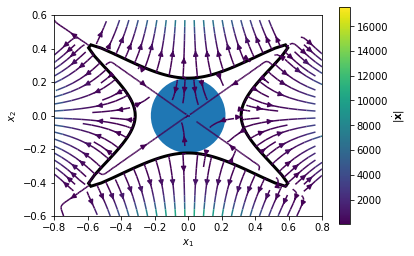

In [9]:
def star_convex():
    # Construct a non-convex 2D level set.
    x = np.array([Variable("x"), Variable("y")]).reshape((2,))
    A1 = np.array([[1, 2], [3, 4]])
    A2 = A1 @ np.array([[-1, 0], [0, 1]])  # mirror about y-axis
    U = (x.T.dot(A1.T.dot(A1.dot(x)))) * (x.T.dot(A2.T.dot(A2.dot(x))))

    fig, ax = plt.subplots()

    theta = 0.5;
    R = np.array([[np.cos(theta), np.sin(theta)], [-np.sin(theta), np.cos(theta)]])
    dUdx = U.Jacobian(x)
    sys = SymbolicVectorSystem(state=x, dynamics=(U-1)* dUdx.T)
    context = sys.CreateDefaultContext()

    options = RegionOfAttractionOptions()
    options.lyapunov_candidate = x.dot(x)
    options.state_variables = x
    V = RegionOfAttraction(sys, context, options)
    plot_sublevelset_expression(ax, V)
    plot_sublevelset_expression(ax, U, 101, linewidth=3, fill=False);

    plot_2d_phase_portrait(sys, (-.8, .8), (-.6, .6))

if running_as_notebook:  # This test is flakey with some solvers.
    star_convex()

# Outer approximation for the cubic polynomial

In [12]:
def cubic_outer():
    prog = MathematicalProgram()
    x = prog.NewIndeterminates(1, "x")[0]
    f = -x + x**3

    # Make B(x) a free polynomial.
    B = prog.NewEvenDegreeFreePolynomial(Variables([x]), 4, "b").ToExpression()

    # Bdot(x) negative definite
    Bdot = B.Jacobian([x]).dot(f)[0]
    prog.AddSosConstraint(-Bdot + 0.1*x**2)

    # B(0) >= 0.1
    prog.AddLinearConstraint(B.Substitute({x: 0}) >= 0.1)

    # Construct W(x) as a SOS polynomial
    # Note: doing it manually to make the integration easier
    W = prog.NewEvenDegreeSosPolynomial(Variables([x]), 4)[0]
    We = W.ToExpression()

    # W(x) > B(x) + 1.0
    prog.AddSosConstraint(We - B - 1.0)

    # min \int_{-2}^2 W(x)dx
    prog.AddCost(W.Integrate(x, -2, 2).ToExpression())

    result = Solve(prog)

    assert result.is_success()

    Bsol = result.GetSolution(B)
    print(f"B = {Bsol}")
    Wsol = result.GetSolution(W)
    fig, ax = plt.subplots()
    xs = np.linspace(-2, 2, 51)
    fsols = [f.Evaluate({x: xi}) for xi in xs]
    Bsols = [Bsol.Evaluate({x: xi}) for xi in xs]
    Wsols = [Wsol.Evaluate({x: xi}) for xi in xs]
    ax.plot(xs, 0*xs, 'k')
    ax.plot(xs, fsols)[0].set_label('f(x)')
    ax.plot(xs, Bsols)[0].set_label('B(x)')
    ax.plot(xs, Wsols)[0].set_label('W(x)')
    plt.ylim(-2.5, 2.5)
    ax.legend()
    display(mpld3.display())

cubic_outer()

B = (0.10000000046721777 + 0.03529968767109825 * pow(x(0), 2) - 0.13295669101456054 * pow(x(0), 4))


# Global stability of the simple pendulum via SOS

Mechanical Energy = 
(4.9050000000000002 * (1 - c(0)) + 0.125 * pow(thetadot(0), 2))
V =
2.4401174273695858*1 + 0.12628047690143832*thetadot(0)^2 + -4.8801919721200111*c(0) + 2.4400745447504253*c(0)^2 + -1.5627957446607424e-06*s(0) + 0.070015479488831661*s(0) * thetadot(0) + 4.0194932059087317e-06*s(0) * c(0) + 2.4648841354261593*s(0)^2


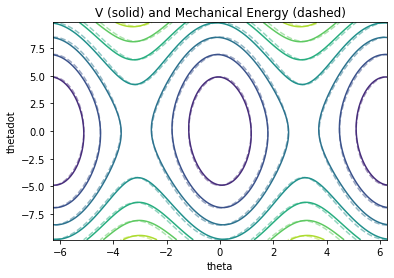

In [13]:
def global_pendulum():
    prog = MathematicalProgram()

    # Declare the "indeterminates", x.  These are the variables which define the
    # polynomials, but are NOT decision variables in the optimization.  We will
    # add constraints below that must hold FOR ALL x.
    s = prog.NewIndeterminates(1, "s")[0]
    c = prog.NewIndeterminates(1, "c")[0]
    thetadot = prog.NewIndeterminates(1, "thetadot")[0]
    # TODO(russt): bind the sugar methods so I can write
    #  x = prog.NewIndeterminates(["s", "c", "thetadot"])
    x = np.array([s, c, thetadot])

    # Write out the dynamics in terms of sin(theta), cos(theta), and thetadot
    p = PendulumParams()
    f = [
        c * thetadot, -s * thetadot,
        (-p.damping() * thetadot - p.mass() * p.gravity() * p.length() * s) /
        (p.mass() * p.length() * p.length())
    ]

    # The fixed-point in this coordinate (because cos(0)=1).
    x0 = np.array([0, 1, 0])

    # Construct a polynomial V that contains all monomials with s,c,thetadot up
    # to degree 2.
    deg_V = 2
    V = prog.NewFreePolynomial(Variables(x), deg_V).ToExpression()

    # Add a constraint to enforce that V is strictly positive away from x0.
    # (Note that because our coordinate system is sine and cosine, V is also zero
    # at theta=2pi, etc).
    eps = 1e-4
    constraint1 = prog.AddSosConstraint(V - eps * (x - x0).dot(x - x0))

    # Construct the polynomial which is the time derivative of V.
    Vdot = V.Jacobian(x).dot(f)

    # Construct a polynomial L representing the "Lagrange multiplier".
    deg_L = 2
    L = prog.NewFreePolynomial(Variables(x), deg_L).ToExpression()

    # Add a constraint that Vdot is strictly negative away from x0 (but make an
    # exception for the upright fixed point by multipling by s^2).
    constraint2 = prog.AddSosConstraint(-Vdot - L * (s**2 + c**2 - 1) - eps *
                                        (x - x0).dot(x - x0) * s**2)
    # TODO(russt): When V is the mechanical energy, Vdot=-b*thetadot^2, so I may not need all of the multipliers here.                  

    # Add V(0) = 0 constraint
    constraint3 = prog.AddLinearConstraint(
        V.Substitute({
            s: 0,
            c: 1,
            thetadot: 0
        }) == 0)

    # Add V(theta=pi) = mgl, just to set the scale.
    constraint4 = prog.AddLinearConstraint(
        V.Substitute({
            s: 1,
            c: 0,
            thetadot: 0
        }) == p.mass() * p.gravity() * p.length())

    # Call the solver.
    result = Solve(prog)
    assert result.is_success()

    # Note that I've added mgl to the potential energy (relative to the textbook),
    # so that it would be non-negative... like the Lyapunov function.
    mgl = p.mass() * p.gravity() * p.length()
    print("Mechanical Energy = ")
    print(.5 * p.mass() * p.length()**2 * thetadot**2 + mgl * (1 - c))

    print("V =")
    Vsol = Polynomial(result.GetSolution(V))
    print(Vsol.RemoveTermsWithSmallCoefficients(1e-6))

    # Plot the results as contour plots.
    nq = 151
    nqd = 151
    q = np.linspace(-2 * np.pi, 2 * np.pi, nq)
    qd = np.linspace(-2 * mgl, 2 * mgl, nqd)
    Q, QD = np.meshgrid(q, qd)
    Energy = .5 * p.mass() * p.length()**2 * QD**2 + mgl * (1 - np.cos(Q))
    Vplot = Q.copy()
    env = {s: 0., c: 1., thetadot: 0}
    for i in range(nq):
        for j in range(nqd):
            env[s] = np.sin(Q[i, j])
            env[c] = np.cos(Q[i, j])
            env[thetadot] = QD[i, j]
            Vplot[i, j] = Vsol.Evaluate(env)

    # plt.rc("text", usetex=True)
    fig, ax = plt.subplots()
    ax.contour(Q, QD, Vplot)
    ax.contour(Q, QD, Energy, alpha=0.5, linestyles="dashed")
    ax.set_xlabel("theta")
    ax.set_ylabel("thetadot")
    ax.set_title("V (solid) and Mechanical Energy (dashed)")

global_pendulum()

# Verifying trigonometric polynomial systems in implicit form.

In order to achieve region of attraction analysis of general MultibodyPlant systems, we lean into the Drake's symbolic engine. Here is an example of the type of symbolic substitutions that go on behind the scenes in the `RegionOfAttraction` code.

In [19]:
from IPython.display import display, Math
from pydrake.examples.pendulum import PendulumPlant
from pydrake.examples.acrobot import AcrobotPlant
from pydrake.all import MultibodyPlant, Parser, SinCos, MakeVectorVariable, ToLatex, Substitute, Box
from underactuated import FindResource
from underactuated.scenarios import AddShape


def PrintImplicitPolynomialDynamics(plant,
                                    context,
                                    sincos_indices):
    sym_plant = plant.ToSymbolic()
    sym_context = sym_plant.CreateDefaultContext()
    sym_context.SetTimeStateAndParametersFrom(context)
    sym_plant.FixInputPortsFrom(plant, context, sym_context)

    state = sym_context.get_continuous_state()
    derivatives = sym_context.Clone().get_mutable_continuous_state()

    q = MakeVectorVariable(state.num_q(), "q")
    v = MakeVectorVariable(state.num_v(), "v")
    qd = MakeVectorVariable(state.num_q(), "\dot{q}")
    vd = MakeVectorVariable(state.num_v(), "\dot{v}")

    state.SetFromVector(np.hstack((q, v)))
    derivatives.SetFromVector(np.hstack((qd, vd)))
    residual = sym_plant.CalcImplicitTimeDerivativesResidual(
        sym_context, derivatives)
        
    s = MakeVectorVariable(state.num_q(), "s")
    c = MakeVectorVariable(state.num_q(), "c")
    subs = {}
    for i in sincos_indices:
        subs[q[i]] = SinCos(s[i], c[i])
    
    display(Markdown("$"+ToLatex(residual, 2) + "= 0$"))
    dynamics = Substitute(residual, subs)

    display(Markdown("$"+ToLatex(dynamics, 2) + "= 0$"))


def TestPendulum():
    plant = PendulumPlant()
    context = plant.CreateDefaultContext()
    plant.get_input_port().FixValue(context, [0])
    indices = [0]
    PrintImplicitPolynomialDynamics(plant, context, indices)

TestPendulum()

# def TestAcrobot():
#     plant = AcrobotPlant()
#     context = plant.CreateDefaultContext()
#     plant.get_input_port().FixValue(context, [0])
#     indices = [0, 1]
#     PrintImplicitPolynomialDynamics(plant, context, indices)

# TestAcrobot()

def TestCartPole():
    plant = MultibodyPlant(0.0)
    Parser(plant).AddModelFromFile(FindResource('models/cartpole.urdf'))
    plant.Finalize()
    context = plant.CreateDefaultContext()
    plant.get_actuation_input_port().FixValue(context, [0])
    indices = [1]
    PrintImplicitPolynomialDynamics(plant, context, indices)

# TestCartPole()

# # Example w/ quaternions
# def TestFloatingBaseBody():
#     plant = MultibodyPlant(0.0)
#     AddShape(plant, Box(1,2,3), "body", 1)
#     plant.Finalize()
#     context = plant.CreateDefaultContext()
#     indices=[]
#     PrintImplicitPolynomialDynamics(plant, context, indices)

# TestFloatingBaseBody()

$\begin{bmatrix} ( - v_{0} + \dot{q}_{0}) \\ (\dot{v}_{0} - \frac{( - 0.10v_{0} - 4.91\sin{q_{0}})}{0.25}) \end{bmatrix}= 0$

$\begin{bmatrix} ( - v_{0} + \dot{q}_{0}) \\ (\dot{v}_{0} - \frac{( - 0.10v_{0} - 4.91s_{0})}{0.25}) \end{bmatrix}= 0$

In [13]:
from pydrake.symbolic import Variable
from pydrake.systems.primitives import SymbolicVectorSystem

# Define a new symbolic Variable
x = Variable("x")

# Define the System.  
plant = SymbolicVectorSystem(state=[x], dynamics=[-x + x**3], output=[x])

# Instantiate the System        

context = plant.CreateDefaultContext()

sym_plant = plant.ToSymbolic()
sym_context = sym_plant.CreateDefaultContext()
sym_context.SetTimeStateAndParametersFrom(context)
sym_plant.FixInputPortsFrom(plant, context, sym_context)

state = sym_context.get_continuous_state()
derivatives = sym_context.Clone().get_mutable_continuous_state()

# q = MakeVectorVariable(state.num_q(), "q")
# v = MakeVectorVariable(state.num_v(), "v")
# qd = MakeVectorVariable(state.num_q(), "\dot{q}")
# vd = MakeVectorVariable(state.num_v(), "\dot{v}")

xd = MakeVectorVariable(1, "\dot{x}")
x = MakeVectorVariable(1, "x")

state.SetFromVector(x)
derivatives.SetFromVector(xd)
residual = sym_plant.CalcImplicitTimeDerivativesResidual(
    sym_context, derivatives)

print(type(Polynomial(residual[0])))


display(Markdown("$"+ToLatex(residual, 2) + "= 0$"))

prog = MathematicalProgram()
prog.AddIndeterminates(x)
prog.AddIndeterminates(xd)

<class 'pydrake.symbolic.Polynomial'>


$\begin{bmatrix} (\dot{x}_{0} + x_{0} - x_{0}^{3}) \end{bmatrix}= 0$

In [117]:
prog = MathematicalProgram()
x = prog.NewIndeterminates(1, "x")
y = prog.NewIndeterminates(1, "y")

comb = np.hstack([x, y])

tester = prog.NewFreePolynomial(Variables(comb), 1)
display(Markdown("$"+ToLatex(tester.ToExpression())+"$"))

$(a_{2} + x_{0} a_{1} + y_{0} a_{0})$

In [ ]:
from sympy import symbols, solve

def sos_v_roa(): 
    
    old_num = float('inf')

    x_val = -100

    eps_converge = 0.01

    count = 0
    
    ra = 10
    
    while True:
        prog = MathematicalProgram()
        x = prog.NewIndeterminates(1, "x")
        xd = prog.NewIndeterminates(1, "xd")
        g = xd + x - x**3
        
        if count == 0:
            V =  x.dot(x) 
        else: 
            V = round(result.GetSolution(P0), ra)*x[0]**2 + 2*x[0]*round(result.GetSolution(P1), ra) + round(result.GetSolution(P2), ra)
            
        # fix V solve for lambda_
        Vdot = V.Jacobian(x).dot(xd)

        # Define the Lagrange multiplier.
        #lambda_ = prog.NewSosPolynomial(Variables(x), 2)[0].ToExpression()
        
        S00 = prog.NewContinuousVariables(1, 'S00')[0]
        S20 = prog.NewContinuousVariables(1, 'S20')[0]
        S11 = prog.NewContinuousVariables(1, 'S11')[0]
        S21 = prog.NewContinuousVariables(1, 'S21')[0]
        S10 = prog.NewContinuousVariables(1, 'S10')[0]
        S22 = prog.NewContinuousVariables(1, 'S22')[0]
        
        
        lambda_ = S22 + 2*x[0]*xd[0]*S10 + 2*x[0]*S21 + x[0]*x[0]*S11 + 2*xd[0]*S20 + xd[0]*xd[0]*S00
        
        prog.AddSosConstraint(lambda_)
        
        A2 = prog.NewContinuousVariables(1, 'A2')[0]
        A1 = prog.NewContinuousVariables(1, 'A1')[0]
        A0 = prog.NewContinuousVariables(1, 'A0')[0]
        
        lambda_g = A2 + x[0]*A1 + xd[0]*A0
                
#         display(Markdown("$\lambda (x) Candidate = " + ToLatex(
#         Polynomial(lambda_).RemoveTermsWithSmallCoefficients(1e-5).ToExpression(),6) + "$"))

        prog.AddSosConstraint(-Vdot + lambda_*(V - 1) + lambda_g*g[0])

        result = Solve(prog)
        
        k = result.get_solver_details().solution_status
        
        print("Solver value: " + str(k))
        assert result.is_success()
        
        display(Markdown("$\lambda (x) = " + ToLatex(
        Polynomial(result.GetSolution(lambda_)).RemoveTermsWithSmallCoefficients(1e-5).ToExpression(),6) + "$"))
        
        
        # found lambda_ solve for V
        prog2 = MathematicalProgram()
        x = prog.NewIndeterminates(1, "x")
        xd = prog.NewIndeterminates(1, "xd")
        g = xd + x - x**3
    
        
        P0 = prog2.NewContinuousVariables(1, 'P0')[0]
        P1 = prog2.NewContinuousVariables(1, 'P1')[0]
        P2 = prog2.NewContinuousVariables(1, 'P2')[0]
        
        V2 = P0*x[0]**2 + 2*x[0]*P1+P2
        
        prog2.AddSosConstraint(V2)
        
        prog2.AddLinearConstraint(V2.Substitute({x[0]: 0}) == 0)
    
        Vdot = V2.Jacobian(x).dot(xd)
        
        So22 = round(result.GetSolution(S22), ra)
        So10 = round(result.GetSolution(S10), ra)
        So21 = round(result.GetSolution(S21), ra)
        So11 = round(result.GetSolution(S11), ra)
        So20 = round(result.GetSolution(S20), ra)
        So00 = round(result.GetSolution(S00), ra)
        
        lambda2 = So22 + 2*x[0]*xd[0]*So10 + 2*x[0]*So21 + x[0]*x[0]*So11 + 2*xd[0]*So20 + xd[0]*xd[0]*So00
        
        Ao2 = round(result.GetSolution(A2), ra)
        Ao1 = round(result.GetSolution(A1), ra)
        Ao0 = round(result.GetSolution(A0), ra)
        
        lambdag2 = Ao2 + x[0]*Ao1 + xd[0]*Ao0
        
        prog2.AddSosConstraint(-Vdot + lambda2*(V2 - 1) + lambdag2*g[0])
        
        prog2.AddLinearCost(P0)

        result = Solve(prog2)
        
        k = result.get_solver_details().solution_status
                
        print("Solver value: " + str(k))
        
        assert result.is_success()
                
        display(Markdown("$V(x) = " + ToLatex(
        Polynomial(result.GetSolution(V2)).RemoveTermsWithSmallCoefficients(1e-5).ToExpression(),6) + "$"))
        
        y = symbols('y')
        
        expr = round(result.GetSolution(P0), ra)*y**2 + 2*y*round(result.GetSolution(P1), ra) + round(result.GetSolution(P2), ra) -1
        
        sol = solve(expr)
        
        num = abs(sol[0])
        
        print(num)
        print(old_num)
        
        if count == 0:
            old_num = num
        else:
            if abs(old_num-num)/abs(old_num) < eps_converge:
                x_val = num
                break
            else:
                old_num = num
                
        count = count+1
            
    return x_val
            
        
d = sos_v_roa()

Solver value: 1


## Candidate V for Implicit Dynamics

In [144]:
def verify_implicit_v():
    prog = MathematicalProgram()
    x = prog.NewIndeterminates(1, "x")
    xd = prog.NewIndeterminates(1, "xd")
    g = xd + x - x**3
    
    y = np.hstack([x, xd])
    
    lambda_ = prog.NewSosPolynomial(Variables(y), 2)[0].ToExpression()
    
    V = x.dot(x)
    Vdot = V.Jacobian(x).dot(xd)
    
    lambda_g = prog.NewFreePolynomial(Variables(y), 1).ToExpression()
    
    prog.AddSosConstraint(lambda_)
    
    d = 1
    
    #prog.AddSosConstraint(-Vdot + lambda_*(V - 1) + lambda_g*g[0])
    prog.AddSosConstraint((V - 1)*pow(x.dot(x), d) - lambda_ * Vdot + lambda_g*g[0])
        
    result = Solve(prog)
    
    k = result.get_solver_details().solution_status
                
    print("Solver value: " + str(k))
    
    assert result.is_success()
    
    print(result.GetSolution(lambda_))
    print(result.GetSolution(lambda_g))

verify_implicit_v()

Solver value: 1
(0.50000000008670065 - 9.4630685672420895e-21 * x(0) - 1.294360254688182e-20 * xd(0) - 5.8284297246930362e-10 * (x(0) * xd(0)) + 8.7210463548496243e-10 * pow(x(0), 2) + 2.6156675394185156e-10 * pow(xd(0), 2))
(0.99999999966725306 * x(0) - 1.0480896728431857e-10 * xd(0))


In [205]:
from pydrake.solvers.mathematicalprogram import MathematicalProgram, SolverOptions, Solve
from pydrake.solvers.csdp import CsdpSolver
from pydrake.solvers.mosek import MosekSolver

negative_infinity = float('-inf')

def find_implicit_lambdas(x, xd, V, Vdot, g):
    prog = MathematicalProgram()
    prog.AddIndeterminates(x)
    prog.AddIndeterminates(xd)
    alpha = prog.NewContinuousVariables(1, 'alpha')[0]
    
    y = np.hstack([x, xd])
    
    l_deg = math.ceil(V.TotalDegree()/2) * 2
    
    lambda_ = prog.NewSosPolynomial(Variables(y), l_deg)[0]
    
    lambda_g = []
    
    for i in range(g.size): 
        gi_deg = max(l_deg + V.TotalDegree() - g[0].TotalDegree(), 0)
        lambda_g.append(prog.NewFreePolynomial(Variables(y), gi_deg))
        
    lambda_g = np.array(lambda_g)    
  
    prog.AddSosConstraint(-Vdot - alpha*V + lambda_*(V - 1) + lambda_g.dot(g))
    prog.AddLinearCost(-alpha)
    
    solver = MosekSolver()
    result = solver.Solve(prog)
    
    k = result.get_solver_details().solution_status
                
    print("Lambda solution status: " + str(k))
    
    assert result.is_success()
    
    lambda_g_results = []
    
    for i in range(g.size):
        lambda_g_results.append(result.GetSolution(lambda_g[i]))
            
    return result.GetSolution(lambda_), np.array(lambda_g_results), result.GetSolution(alpha)

def find_implicit_V(x, xd, lambda_, lambda_g, g, V_degree, alpha):
    prog = MathematicalProgram()
    prog.AddIndeterminates(x)
    prog.AddIndeterminates(xd)
    
    y = np.hstack([x, xd])
    
    V, Q = prog.NewSosPolynomial(Variables(x), V_degree)
    Vdot = V.Jacobian(x).dot(xd)
    
    prog.AddSosConstraint(-Vdot -alpha*V + lambda_*(V - 1) + lambda_g.dot(g))
    
    prog.AddLinearCost(np.trace(Q))    
    prog.AddLinearConstraint(V.ToExpression().Substitute({x[0]: 0}) == 0)
    
    solver = MosekSolver()
    result = solver.Solve(prog)
    
    k = result.get_solver_details().solution_status
                
    print("V solution status: " + str(k))
    
    assert result.is_success()
        
    return result.GetSolution(V), result.GetSolution(Q)


def problem_solver_implicit():
    prog = MathematicalProgram()
    x = prog.NewIndeterminates(1, "x")
    xd = prog.NewIndeterminates(1, "xd")
    
    g = xd + x - x**3
    
    V_degree = 2
    V = 2*x.dot(x)
    Vdot = V.Jacobian(x).dot(xd)
    
    V = Polynomial(V)
    Vdot = Polynomial(Vdot)
    
    g_poly = []
    for i in range(g.size):
        g_poly.append(Polynomial(g[i]))
        
    g_poly = np.array(g_poly)
    
    for i in range(1):
        lambda_, lambda_g, alpha = find_implicit_lambdas(x, xd, V, Vdot, g_poly)
        display(Markdown("$ \lambda(x) = "+ToLatex(lambda_.ToExpression())+"$"))
        display(Markdown("$ \lambda_g(x) = "+ToLatex(lambda_g[0].ToExpression())+"$"))
        display(Markdown("$ alpha = "+str(alpha)+"$"))
        
        V, Q = find_implicit_V(x, xd, lambda_, lambda_g, g_poly, V_degree, alpha)
        
#         P0 = list(V.monomial_to_coefficient_map().values())[2].Evaluate({})
#         P1 = list(V.monomial_to_coefficient_map().values())[1].Evaluate({})
#         P2 = list(V.monomial_to_coefficient_map().values())[0].Evaluate({})
        
#         Q_emp = np.array([[P0, P1], [P1, P2]])
        
        #print(np.linalg.eigvalsh(Q))
#         print(np.linalg.eigvalsh(Q_emp))
        
        #display(Markdown("$"+ToLatex(lambda_g[0].ToExpression())+"$"))
        display(Markdown("$"+ToLatex(V.ToExpression(), 9)+"$"))

In [206]:
problem_solver_implicit()

Lambda solution status: 1


$ \lambda(x) = (0.000 + 0.000x_{0} + 0.000xd_{0} + 1.515x_{0} xd_{0} + 2.565x_{0}^{2} + 0.769xd_{0}^{2})$

$ \lambda_g(x) = (0.000 + 4.747x_{0} + 1.493xd_{0})$

$ alpha = 0.9999999989747707$

V solution status: 1


$(0.000000002 - 0.000000000x_{0} + 1.999999996x_{0}^{2})$

In [207]:
prog = MathematicalProgram()
x = prog.NewIndeterminates(1, "x")

V, Q = prog.NewSosPolynomial(Variables(x), 2)
prog.AddLinearCost(np.trace(Q))

<pydrake.solvers.mathematicalprogram.Binding[LinearCost] at 0x7fd4c792f4f0>

In [28]:
Q

array([[Variable('S(0,0)', Continuous), Variable('S(1,0)', Continuous)],
       [Variable('S(1,0)', Continuous), Variable('S(1,1)', Continuous)]],
      dtype=object)

In [29]:
V.RemoveTermsWithSmallCoefficients

<Polynomial "S(1,1)*1 + (2 * S(1,0))*x(0) + S(0,0)*x(0)^2">

In [30]:
lc = prog.linear_costs()[0]

In [31]:
d = lc.evaluator()

In [33]:
d.a().dot(lc.variables())

<Expression "(S(0,0) + S(1,1))">

In [51]:
c = True

if not not(c):
    print("Hi")

Hi


## Implicit 1D Lyapunov with Backoff Program

In [289]:
#THIS CODE WORKS

from pydrake.solvers.mathematicalprogram import MathematicalProgram, SolverOptions, Solve
from pydrake.solvers.csdp import CsdpSolver
from pydrake.solvers.mosek import MosekSolver

negative_infinity = float('-inf')

def find_implicit_lambdas(x, xd, V, Vdot, g):
    prog = MathematicalProgram()
    prog.AddIndeterminates(x)
    prog.AddIndeterminates(xd)
    
    y = np.hstack([x, xd])
    
    l_deg = math.ceil(V.TotalDegree()/2) * 2
    
    lambda_ = prog.NewSosPolynomial(Variables(y), l_deg)[0]
    
    lambda_g = []
    
    for i in range(g.size): 
        gi_deg = max(l_deg + V.TotalDegree() - g[0].TotalDegree(), 0)
        lambda_g.append(prog.NewFreePolynomial(Variables(y), gi_deg))
        
    lambda_g = np.array(lambda_g)    
  
    prog.AddSosConstraint(-Vdot + lambda_*(V - 1) + lambda_g.dot(g))
    
    solver = MosekSolver()
    result = solver.Solve(prog)
    
    k = result.get_solver_details().solution_status
                
    print("Lambda solution status: " + str(k))
    
    assert result.is_success()
    
    lambda_g_results = []
    
    for i in range(g.size):
        lambda_g_results.append(result.GetSolution(lambda_g[i]))
    
    return result.GetSolution(lambda_), np.array(lambda_g_results)

def find_implicit_V(x, xd, lambda_, lambda_g, g, V_degree):
    prog = MathematicalProgram()
    prog.AddIndeterminates(x)
    prog.AddIndeterminates(xd)
    
    y = np.hstack([x, xd])
    
    V, Q = prog.NewSosPolynomial(Variables(x), V_degree)
    Vdot = V.Jacobian(x).dot(xd)
    
    prog.AddSosConstraint(-Vdot + lambda_*(V - 1) + lambda_g.dot(g))
    
    prog.AddLinearCost(np.trace(Q))    
    prog.AddLinearConstraint(V.ToExpression().Substitute({x[0]: 0}) == 0)
    
    solver = MosekSolver()
    result = solver.Solve(prog)
    
#     if not result.is_success():
#         cost_val = np.trace(Q_prev)
#         backoff_scale = 0.0000
#         result = BackoffProgram(prog, cost_val, backoff_scale)
    
    k = result.get_solver_details().solution_status
                
    print("V solution status: " + str(k))
    
    assert result.is_success()
        
    return result.GetSolution(V), result.GetSolution(Q)

def BackoffProgram(prog, cost_val, backoff_scale):
    linear_cost = prog.linear_costs()[0];
    prog.RemoveCost(linear_cost)
    
    if cost_val > 0:
        upper_bound = (1 + backoff_scale) * cost_val - linear_cost.evaluator().b()
    else:
        upper_bound = (1 - backoff_scale) * cost_val - linear_cost.evaluator().b()
        
    # find a way to change this to expression
    cost_expression = linear_cost.evaluator().a().dot(linear_cost.variables())
    prog.AddLinearConstraint(cost_expression, 1, upper_bound)
    
    solver = MosekSolver()
    result = solver.Solve(prog)
    
    assert result.is_success(), "Backoff Failed"
    
    return result

def problem_solver_implicit():
    prog = MathematicalProgram()
    x = prog.NewIndeterminates(1, "x")
    xd = prog.NewIndeterminates(1, "xd")
    
    g = xd + x - x**3
    
    V_degree = 2
    V = 100*x.dot(x)
    Vdot = V.Jacobian(x).dot(xd)
    
    V = Polynomial(V)
    Vdot = Polynomial(Vdot)
    
    g_poly = []
    for i in range(g.size):
        g_poly.append(Polynomial(g[i]))
        
    g_poly = np.array(g_poly)
    
    for i in range(20):
        lambda_, lambda_g = find_implicit_lambdas(x, xd, V, Vdot, g_poly)
        display(Markdown("$ \lambda(x)="+ToLatex(lambda_.ToExpression())+"$"))
        
        V, Q = find_implicit_V(x, xd, lambda_, lambda_g, g_poly, V_degree)
        
        Vdot = V.Jacobian(x).dot(xd)
     
        
#         P0 = list(V.monomial_to_coefficient_map().values())[2].Evaluate({})
#         P1 = list(V.monomial_to_coefficient_map().values())[1].Evaluate({})
#         P2 = list(V.monomial_to_coefficient_map().values())[0].Evaluate({})
        #coeff = list(V.monomial_to_coefficient_map().values())[0].Evaluate({})
        #print(coeff)
        
        #V = coeff * x.dot(x)
    
#         Q_emp = np.array([[P0, P1], [P1, P2]])
        
        #print(np.linalg.eigvalsh(Q))
#         print(np.linalg.eigvalsh(Q_emp))
        
        #display(Markdown("$"+ToLatex(lambda_g[0].ToExpression())+"$"))
        display(Markdown("$ V(x)="+ToLatex(V.ToExpression(), 9)+"$"))

In [290]:
problem_solver_implicit()

Lambda solution status: 1


$ \lambda(x)=(0.000 + 0.000x_{0} - 0.000xd_{0} + 0.599x_{0} xd_{0} + 1.669x_{0}^{2} + 1.146xd_{0}^{2})$

V solution status: 1


$ V(x)=(0.000000001 - 0.000000000x_{0} + 57.873976955x_{0}^{2})$

Lambda solution status: 1


$ \lambda(x)=(0.000 + 0.000x_{0} - 0.000xd_{0} + 0.437x_{0} xd_{0} + 1.534x_{0}^{2} + 1.264xd_{0}^{2})$

V solution status: 1


$ V(x)=(0.000000002 - 0.000000000x_{0} + 37.114946406x_{0}^{2})$

Lambda solution status: 1


$ \lambda(x)=(0.000 - 0.000x_{0} + 0.000xd_{0} + 0.233x_{0} xd_{0} + 1.812x_{0}^{2} + 1.234xd_{0}^{2})$

V solution status: 1


$ V(x)=(0.000000007 - 0.000000000x_{0} + 20.608652088x_{0}^{2})$

Lambda solution status: 1


$ \lambda(x)=(0.000 - 0.000x_{0} + 0.000xd_{0} + 0.299x_{0} xd_{0} + 1.808x_{0}^{2} + 1.059xd_{0}^{2})$

V solution status: 1


$ V(x)=(0.000000001 - 0.000000000x_{0} + 11.356738227x_{0}^{2})$

Lambda solution status: 1


$ \lambda(x)=(0.000 - 0.000x_{0} + 0.000xd_{0} + 0.569x_{0} xd_{0} + 1.695x_{0}^{2} + 1.161xd_{0}^{2})$

V solution status: 1


$ V(x)=(0.000000002 + 0.000000000x_{0} + 6.667777824x_{0}^{2})$

Lambda solution status: 1


$ \lambda(x)=(0.000 + 0.000x_{0} + 0.000xd_{0} + 0.355x_{0} xd_{0} + 1.516x_{0}^{2} + 1.141xd_{0}^{2})$

V solution status: 1


$ V(x)=(0.000000007 - 0.000000000x_{0} + 4.772059608x_{0}^{2})$

Lambda solution status: 1


$ \lambda(x)=(0.000 - 0.000x_{0} + 0.000xd_{0} + 0.319x_{0} xd_{0} + 1.490x_{0}^{2} + 1.067xd_{0}^{2})$

V solution status: 1


$ V(x)=(0.000000007 - 0.000000000x_{0} + 3.649992864x_{0}^{2})$

Lambda solution status: 1


$ \lambda(x)=(0.000 - 0.000x_{0} + 0.000xd_{0} + 0.417x_{0} xd_{0} + 1.575x_{0}^{2} + 1.064xd_{0}^{2})$

V solution status: 1


$ V(x)=(0.000000004 - 0.000000000x_{0} + 2.739643859x_{0}^{2})$

Lambda solution status: 1


$ \lambda(x)=(0.000 - 0.000x_{0} + 0.000xd_{0} + 0.592x_{0} xd_{0} + 1.655x_{0}^{2} + 1.027xd_{0}^{2})$

V solution status: 1


$ V(x)=(0.000000004 - 0.000000000x_{0} + 2.074103941x_{0}^{2})$

Lambda solution status: 1


$ \lambda(x)=(0.000 - 0.000x_{0} + 0.000xd_{0} + 0.756x_{0} xd_{0} + 1.783x_{0}^{2} + 0.960xd_{0}^{2})$

V solution status: 1


$ V(x)=(0.000000001 - 0.000000000x_{0} + 1.584500783x_{0}^{2})$

Lambda solution status: 1


$ \lambda(x)=(0.000 - 0.000x_{0} + 0.000xd_{0} + 0.815x_{0} xd_{0} + 1.752x_{0}^{2} + 0.854xd_{0}^{2})$

V solution status: 1


$ V(x)=(0.000000002 - 0.000000000x_{0} + 1.335438775x_{0}^{2})$

Lambda solution status: 1


$ \lambda(x)=(0.000 - 0.000x_{0} - 0.000xd_{0} + 1.050x_{0} xd_{0} + 1.794x_{0}^{2} + 0.851xd_{0}^{2})$

V solution status: 1


$ V(x)=(0.000000001 - 0.000000000x_{0} + 1.198855518x_{0}^{2})$

Lambda solution status: 1


$ \lambda(x)=(0.000 - 0.000x_{0} - 0.000xd_{0} + 1.165x_{0} xd_{0} + 1.846x_{0}^{2} + 0.839xd_{0}^{2})$

V solution status: 1


$ V(x)=(0.000000006 - 0.000000000x_{0} + 1.116332657x_{0}^{2})$

Lambda solution status: 1


$ \lambda(x)=(0.000 - 0.000x_{0} - 0.000xd_{0} + 1.236x_{0} xd_{0} + 1.891x_{0}^{2} + 0.827xd_{0}^{2})$

V solution status: 1


$ V(x)=(0.000000006 - 0.000000000x_{0} + 1.066406549x_{0}^{2})$

Lambda solution status: 1


$ \lambda(x)=(0.000 - 0.000x_{0} - 0.000xd_{0} + 1.274x_{0} xd_{0} + 1.934x_{0}^{2} + 0.806xd_{0}^{2})$

V solution status: 1


$ V(x)=(0.000000003 - 0.000000000x_{0} + 1.036658848x_{0}^{2})$

Lambda solution status: 1


$ \lambda(x)=(0.000 + 0.000x_{0} + 0.000xd_{0} + 1.289x_{0} xd_{0} + 1.973x_{0}^{2} + 0.783xd_{0}^{2})$

V solution status: 1


$ V(x)=(0.000000001 + 0.000000000x_{0} + 1.018420062x_{0}^{2})$

Lambda solution status: 1


$ \lambda(x)=(0.000 - 0.000x_{0} - 0.000xd_{0} + 1.332x_{0} xd_{0} + 2.013x_{0}^{2} + 0.780xd_{0}^{2})$

V solution status: 1


$ V(x)=(0.000000001 - 0.000000000x_{0} + 1.008926161x_{0}^{2})$

Lambda solution status: 1


$ \lambda(x)=(0.000 + 0.000x_{0} - 0.000xd_{0} + 1.480x_{0} xd_{0} + 2.029x_{0}^{2} + 0.868xd_{0}^{2})$

V solution status: 1


$ V(x)=(0.000000004 + 0.000000000x_{0} + 1.004851641x_{0}^{2})$

Lambda solution status: 1


$ \lambda(x)=(0.000 + 0.000x_{0} - 0.000xd_{0} + 1.542x_{0} xd_{0} + 2.027x_{0}^{2} + 0.909xd_{0}^{2})$

V solution status: 1


$ V(x)=(0.000000001 - 0.000000000x_{0} + 1.002974102x_{0}^{2})$

Lambda solution status: 1


$ \lambda(x)=(0.000 + 0.000x_{0} + 0.000xd_{0} + 1.499x_{0} xd_{0} + 2.022x_{0}^{2} + 0.883xd_{0}^{2})$

V solution status: 1


$ V(x)=(0.000000000 + 0.000000000x_{0} + 1.001800415x_{0}^{2})$

In [155]:
from pydrake.solvers.mathematicalprogram import MathematicalProgram, SolverOptions, Solve
from pydrake.solvers.csdp import CsdpSolver
from pydrake.solvers.mosek import MosekSolver

negative_infinity = float('-inf')

def find_implicit_lambdas(x, xd, V, Vdot, g):
    prog = MathematicalProgram()
    prog.AddIndeterminates(x)
    prog.AddIndeterminates(xd)
    
    y = np.hstack([x, xd])
    
    l_deg = math.ceil(V.TotalDegree()/2) * 2
    
    lambda_, Q_lambda = prog.NewSosPolynomial(Variables(y), l_deg)
    
    lambda_g = []
    
    for i in range(g.size): 
        gi_deg = max(l_deg + V.TotalDegree() - g[0].TotalDegree(), 0)
        lambda_g.append(prog.NewFreePolynomial(Variables(y), gi_deg))
        
    lambda_g = np.array(lambda_g)    
  
    prog.AddSosConstraint(-Vdot + lambda_*(V - 1) + lambda_g.dot(g))
    
    #prog.AddLinearCost(np.trace(Q_lambda))
    
    solver = MosekSolver()
    result = solver.Solve(prog)
        
    cost_val = np.trace(result.GetSolution(Q_lambda))
    cost_val_2 = np.sum(result.GetSolution(prog.decision_variables()[6:9]))
    backoff_scale = 0.000
    
    result = BackoffProgram2(prog, cost_val, cost_val_2, backoff_scale, Q_lambda)
    
    k = result.get_solver_details().solution_status
                
    print("Lambda solution status: " + str(k))
    
    assert result.is_success()
    
    lambda_g_results = []
    
    for i in range(g.size):
        lambda_g_results.append(result.GetSolution(lambda_g[i]))
    
    return result.GetSolution(lambda_), np.array(lambda_g_results)

def BackoffProgram2(prog, cost_val, cost_val_2, backoff_scale, Q_lambda): 
    upper_bound = (1 - backoff_scale) * cost_val
    prog.AddLinearConstraint(np.trace(Q_lambda), negative_infinity, upper_bound)
    
    upper_bound_2 = (1 - backoff_scale) * cost_val_2
    prog.AddLinearConstraint(np.sum(prog.decision_variables()[6:9]), negative_infinity, upper_bound_2)
    
    solver = MosekSolver()
    result = solver.Solve(prog)
    
    return result

def find_implicit_V(x, xd, lambda_, lambda_g, g, V_degree, Q_prev=None):
    prog = MathematicalProgram()
    prog.AddIndeterminates(x)
    prog.AddIndeterminates(xd)
    
    y = np.hstack([x, xd])
    
    V, Q = prog.NewSosPolynomial(Variables(x), V_degree)
    Vdot = V.Jacobian(x).dot(xd)
    
    prog.AddSosConstraint(-Vdot + lambda_*(V - 1) + lambda_g.dot(g))
    
    prog.AddLinearCost(np.trace(Q))    
    prog.AddLinearConstraint(V.ToExpression().Substitute({x[0]: 0}) == 0)
    
    solver = MosekSolver()
    result = solver.Solve(prog)
    
    k = result.get_solver_details().solution_status
    
    assert result.is_success(), str(k)
    
    cost_val = result.get_optimal_cost()
    backoff_scale = 0.001
    
    result = BackoffProgram(prog, cost_val, backoff_scale)
    
    k = result.get_solver_details().solution_status
                
    print("V solution status: " + str(k))
        
    return result.GetSolution(V), result.GetSolution(Q)

def BackoffProgram(prog, cost_val, backoff_scale):
    linear_cost = prog.linear_costs()[0];
    prog.RemoveCost(linear_cost)
    
    if cost_val > 0:
        upper_bound = (1 + backoff_scale) * cost_val - linear_cost.evaluator().b()
    else:
        upper_bound = (1 - backoff_scale) * cost_val - linear_cost.evaluator().b()
        
    # find a way to change this to expression
    cost_expression = linear_cost.evaluator().a().dot(linear_cost.variables())
    prog.AddLinearConstraint(cost_expression, 1, upper_bound)
    
    solver = MosekSolver()
    result = solver.Solve(prog)
    
    assert result.is_success(), "Backoff Failed"
    
    return result

def problem_solver_implicit():
    prog = MathematicalProgram()
    x = prog.NewIndeterminates(1, "x")
    xd = prog.NewIndeterminates(1, "xd")
    
    g = xd + x - x**3
    
    V_degree = 2
    V = 20*x.dot(x)
    Vdot = V.Jacobian(x).dot(xd)
    
    V = Polynomial(V)
    Vdot = Polynomial(Vdot)
    
    g_poly = []
    for i in range(g.size):
        g_poly.append(Polynomial(g[i]))
        
    g_poly = np.array(g_poly)
    
    for i in range(9):
        lambda_, lambda_g = find_implicit_lambdas(x, xd, V, Vdot, g_poly)
        display(Markdown("$ \lambda(x)="+ToLatex(lambda_.ToExpression())+"$"))
        display(Markdown("$ \lambda_g(x)="+ToLatex(lambda_g[0].ToExpression())+"$"))
        
        if i == 0: 
            V, Q = find_implicit_V(x, xd, lambda_, lambda_g, g_poly, V_degree)
        else: 
            V, Q = find_implicit_V(x, xd, lambda_, lambda_g, g_poly, V_degree, Q)
        
#         P0 = list(V.monomial_to_coefficient_map().values())[2].Evaluate({})
#         P1 = list(V.monomial_to_coefficient_map().values())[1].Evaluate({})
#         P2 = list(V.monomial_to_coefficient_map().values())[0].Evaluate({})
        
    
#         Q_emp = np.array([[P0, P1], [P1, P2]])
        
        #print(np.linalg.eigvalsh(Q))
#         print(np.linalg.eigvalsh(Q_emp))
        
        #display(Markdown("$"+ToLatex(lambda_g[0].ToExpression())+"$"))
        display(Markdown("$ V(x)="+ToLatex(V.ToExpression(), 9)+"$"))

In [156]:
problem_solver_implicit()

Lambda solution status: 1


$ \lambda(x)=(0.000 - 0.000x_{0} - 0.000xd_{0} + 0.488x_{0} xd_{0} + 0.959x_{0}^{2} + 0.652xd_{0}^{2})$

$ \lambda_g(x)=(-0.000 + 9.857x_{0} + 15.644xd_{0})$

V solution status: 1


$ V(x)=(0.000000000 - 0.000022712x_{0} + 12.965641125x_{0}^{2})$

Lambda solution status: 1


$ \lambda(x)=(0.000 + 0.000x_{0} + 0.000xd_{0} + 0.760x_{0} xd_{0} + 1.487x_{0}^{2} + 0.891xd_{0}^{2})$

$ \lambda_g(x)=(0.000 + 11.528x_{0} + 13.873xd_{0})$

V solution status: 1


$ V(x)=(0.000000000 + 0.000001586x_{0} + 8.846487780x_{0}^{2})$

Lambda solution status: 1


$ \lambda(x)=(0.000 + 0.000x_{0} - 0.000xd_{0} + 1.148x_{0} xd_{0} + 1.923x_{0}^{2} + 1.378xd_{0}^{2})$

$ \lambda_g(x)=(0.000 + 12.438x_{0} + 14.363xd_{0})$

V solution status: 1


$ V(x)=(0.000000000 + 0.000014124x_{0} + 7.009733497x_{0}^{2})$

Lambda solution status: 1


$ \lambda(x)=(0.000 + 0.000x_{0} - 0.000xd_{0} + 1.370x_{0} xd_{0} + 2.454x_{0}^{2} + 1.608xd_{0}^{2})$

$ \lambda_g(x)=(0.000 + 12.372x_{0} + 14.917xd_{0})$

V solution status: 1


$ V(x)=(0.000000001 + 0.000015345x_{0} + 5.629033477x_{0}^{2})$

Lambda solution status: 1


$ \lambda(x)=(0.000 + 0.000x_{0} - 0.000xd_{0} + 1.642x_{0} xd_{0} + 3.093x_{0}^{2} + 2.057xd_{0}^{2})$

$ \lambda_g(x)=(0.000 + 12.317x_{0} + 15.459xd_{0})$

V solution status: 1


$ V(x)=(0.000000001 + 0.000005931x_{0} + 4.539803800x_{0}^{2})$

Lambda solution status: 1


$ \lambda(x)=(0.000 + 0.000x_{0} + 0.000xd_{0} + 1.891x_{0} xd_{0} + 4.048x_{0}^{2} + 2.466xd_{0}^{2})$

$ \lambda_g(x)=(0.000 + 12.857x_{0} + 15.485xd_{0})$

V solution status: 1


$ V(x)=(0.000000002 + 0.000003862x_{0} + 3.674586141x_{0}^{2})$

Lambda solution status: 1


$ \lambda(x)=(0.000 + 0.000x_{0} + 0.000xd_{0} + 2.481x_{0} xd_{0} + 5.405x_{0}^{2} + 3.003xd_{0}^{2})$

$ \lambda_g(x)=(0.000 + 13.797x_{0} + 15.543xd_{0})$

AssertionError: 7

## Lyapunov for an Rational Polynomial system

In [9]:
#THIS CODE WORKS

from pydrake.solvers.mathematicalprogram import MathematicalProgram, SolverOptions, Solve
from pydrake.solvers.csdp import CsdpSolver
from pydrake.solvers.mosek import MosekSolver

negative_infinity = float('-inf')

def find_implicit_lambdas(x, xd, V, Vdot, g):
    prog = MathematicalProgram()
    prog.AddIndeterminates(x)
    prog.AddIndeterminates(xd)
    
    y = np.hstack([x, xd])
    
    l_deg = math.ceil(V.TotalDegree()/2) * 2
    
    lambda_ = prog.NewSosPolynomial(Variables(y), l_deg)[0]
    
    lambda_g = []
    
    for i in range(g.size): 
        gi_deg = max(l_deg + V.TotalDegree() - g[0].TotalDegree(), 0)
        lambda_g.append(prog.NewFreePolynomial(Variables(y), gi_deg))
        
    lambda_g = np.array(lambda_g)    
  
    prog.AddSosConstraint(-Vdot + lambda_*(V - 1) + lambda_g.dot(g))
    
    solver = MosekSolver()
    result = solver.Solve(prog)
    
    k = result.get_solver_details().solution_status
                
    print("Lambda solution status: " + str(k))
    
    assert result.is_success()
    
    lambda_g_results = []
    
    for i in range(g.size):
        lambda_g_results.append(result.GetSolution(lambda_g[i]))
    
    return result.GetSolution(lambda_), np.array(lambda_g_results)

def find_implicit_V(x, xd, lambda_, lambda_g, g, V_degree):
    prog = MathematicalProgram()
    prog.AddIndeterminates(x)
    prog.AddIndeterminates(xd)
    
    y = np.hstack([x, xd])
    
    V, Q = prog.NewSosPolynomial(Variables(x), V_degree)
    Vdot = V.Jacobian(x).dot(xd)
    
    prog.AddSosConstraint(-Vdot + lambda_*(V - 1) + lambda_g.dot(g))
    
    prog.AddLinearCost(np.trace(Q))    
    prog.AddLinearConstraint(V.ToExpression().Substitute({x[0]: 0}) == 0)
    
    solver = MosekSolver()
    result = solver.Solve(prog)
    
#     if not result.is_success():
#         cost_val = np.trace(Q_prev)
#         backoff_scale = 0.0000
#         result = BackoffProgram(prog, cost_val, backoff_scale)
    
    k = result.get_solver_details().solution_status
                
    print("V solution status: " + str(k))
    
    assert result.is_success()
        
    return result.GetSolution(V), result.GetSolution(Q)

def BackoffProgram(prog, cost_val, backoff_scale):
    linear_cost = prog.linear_costs()[0];
    prog.RemoveCost(linear_cost)
    
    if cost_val > 0:
        upper_bound = (1 + backoff_scale) * cost_val - linear_cost.evaluator().b()
    else:
        upper_bound = (1 - backoff_scale) * cost_val - linear_cost.evaluator().b()
        
    # find a way to change this to expression
    cost_expression = linear_cost.evaluator().a().dot(linear_cost.variables())
    prog.AddLinearConstraint(cost_expression, 1, upper_bound)
    
    solver = MosekSolver()
    result = solver.Solve(prog)
    
    assert result.is_success(), "Backoff Failed"
    
    return result

def problem_solver_implicit():
    prog = MathematicalProgram()
    x = prog.NewIndeterminates(1, "x")
    xd = prog.NewIndeterminates(1, "xd")
    
    g = xd*(1 + x**2) + x - x**3
    
    V_degree = 2
    V = 100*x.dot(x)
    Vdot = V.Jacobian(x).dot(xd)
    
    V = Polynomial(V)
    Vdot = Polynomial(Vdot)
    
    g_poly = []
    for i in range(g.size):
        g_poly.append(Polynomial(g[i]))
        
    g_poly = np.array(g_poly)
    
    for i in range(10):
        lambda_, lambda_g = find_implicit_lambdas(x, xd, V, Vdot, g_poly)
        display(Markdown("$ \lambda(x)="+ToLatex(lambda_.ToExpression())+"$"))
        
        V, Q = find_implicit_V(x, xd, lambda_, lambda_g, g_poly, V_degree)
        
        Vdot = V.Jacobian(x).dot(xd)
     
        
#         P0 = list(V.monomial_to_coefficient_map().values())[2].Evaluate({})
#         P1 = list(V.monomial_to_coefficient_map().values())[1].Evaluate({})
#         P2 = list(V.monomial_to_coefficient_map().values())[0].Evaluate({})
        #coeff = list(V.monomial_to_coefficient_map().values())[0].Evaluate({})
        #print(coeff)
        
        #V = coeff * x.dot(x)
    
#         Q_emp = np.array([[P0, P1], [P1, P2]])
        
        #print(np.linalg.eigvalsh(Q))
#         print(np.linalg.eigvalsh(Q_emp))
        
        #display(Markdown("$"+ToLatex(lambda_g[0].ToExpression())+"$"))
        display(Markdown("$ V(x)="+ToLatex(V.ToExpression(), 9)+"$"))

In [10]:
problem_solver_implicit()

Lambda solution status: 1


$ \lambda(x)=(0.000 + 0.000x_{0} - 0.000xd_{0} - 0.075x_{0} xd_{0} + 1.972x_{0}^{2} + 1.058xd_{0}^{2})$

V solution status: 1


$ V(x)=(0.000000001 + 0.000000000x_{0} + 53.743547577x_{0}^{2})$

Lambda solution status: 1


$ \lambda(x)=(0.000 + 0.000x_{0} - 0.000xd_{0} - 0.289x_{0} xd_{0} + 1.845x_{0}^{2} + 1.186xd_{0}^{2})$

V solution status: 1


$ V(x)=(0.000000003 + 0.000000000x_{0} + 29.826749348x_{0}^{2})$

Lambda solution status: 1


$ \lambda(x)=(0.000 + 0.000x_{0} - 0.000xd_{0} - 0.183x_{0} xd_{0} + 2.112x_{0}^{2} + 1.133xd_{0}^{2})$

V solution status: 1


$ V(x)=(0.000000003 + 0.000000000x_{0} + 14.226157851x_{0}^{2})$

Lambda solution status: 1


$ \lambda(x)=(0.000 + 0.000x_{0} - 0.000xd_{0} - 0.334x_{0} xd_{0} + 2.017x_{0}^{2} + 0.936xd_{0}^{2})$

V solution status: 1


$ V(x)=(0.000000003 + 0.000000000x_{0} + 7.172352837x_{0}^{2})$

Lambda solution status: 1


$ \lambda(x)=(0.000 + 0.000x_{0} - 0.000xd_{0} - 0.345x_{0} xd_{0} + 1.763x_{0}^{2} + 0.964xd_{0}^{2})$

V solution status: 1


$ V(x)=(0.000000003 - 0.000000000x_{0} + 4.275168452x_{0}^{2})$

Lambda solution status: 1


$ \lambda(x)=(0.000 + 0.000x_{0} + 0.000xd_{0} - 0.510x_{0} xd_{0} + 1.715x_{0}^{2} + 0.807xd_{0}^{2})$

V solution status: 1


$ V(x)=(0.000000014 - 0.000000000x_{0} + 2.628011830x_{0}^{2})$

Lambda solution status: 1


$ \lambda(x)=(0.000 + 0.000x_{0} + 0.000xd_{0} - 0.363x_{0} xd_{0} + 1.616x_{0}^{2} + 0.669xd_{0}^{2})$

V solution status: 1


$ V(x)=(0.000000001 - 0.000000000x_{0} + 1.737392637x_{0}^{2})$

Lambda solution status: 1


$ \lambda(x)=(0.000 - 0.000x_{0} + 0.000xd_{0} - 0.122x_{0} xd_{0} + 1.491x_{0}^{2} + 0.506xd_{0}^{2})$

V solution status: 1


$ V(x)=(0.000000001 - 0.000000000x_{0} + 1.370295036x_{0}^{2})$

Lambda solution status: 1


$ \lambda(x)=(0.000 + 0.000x_{0} + 0.000xd_{0} - 0.267x_{0} xd_{0} + 1.238x_{0}^{2} + 0.425xd_{0}^{2})$

V solution status: 1


$ V(x)=(0.000000002 - 0.000000000x_{0} + 1.175213221x_{0}^{2})$

Lambda solution status: 1


$ \lambda(x)=(0.000 - 0.000x_{0} + 0.000xd_{0} - 0.212x_{0} xd_{0} + 1.127x_{0}^{2} + 0.392xd_{0}^{2})$

V solution status: 1


$ V(x)=(0.000000001 - 0.000000000x_{0} + 1.087969637x_{0}^{2})$